# Haig Fras Dataset

In [28]:
from paidiverpy.pipeline import Pipeline

In [29]:
pipeline = Pipeline(config_file_path="config/config_benthic.yml")

Checking files have unique names 99/99
☁ paidiverpy ☁  |    WARNING | 2025-02-27 19:12:51 | Metadata does not have a image-altitude-meters type column. It should have one of the following columns: ['image-altitude-meters', 'depth', 'depth_m', 'depth_metres', 'depth_metre', 'depth_meters', 'depth_meter']
☁ paidiverpy ☁  |    WARNING | 2025-02-27 19:12:51 | Some functions may not work properly.


## Show the pipeline

To check the pipeline steps, you just need to run `pipeline`. You can also click in a step to see more information about it

In [30]:
pipeline

## Configuration file

This is the configuration file used in this jupyter notebook


```yaml
general:
  input_path: "images"
  output_path: "output"
  metadata_path: "metadata/metadata_benthic_ifdo.json"
  metadata_type: "IFDO"
  image_type: "PNG"
  n_jobs: 8
  sampling:
    - mode: "fixed"
      params:
        value: 10
steps:
  - colour:
      name: "colour_correction"
      mode: "grayscale"

  - sampling:
      name: "datetime"
      mode: "datetime"
      params:
        min: "2016-05-11 04:14:00"
        max: "2016-05-11 09:27:00"

  - colour:
      name: "colour_correction"
      mode: "gaussian_blur"
      params:
        sigma: 1.0

  - colour:
      name: "sharpen"
      mode: "sharpen"
      params:
        alpha: 1.5
        beta: -0.5

  - colour:
      name: "contrast"
      mode: "contrast"

  - convert:
      name: "crop_images"
      mode: "crop"
      params:
        x: [0, -1]
        y: [0, -1000]
```

But you can also see the configuration file by running `pipeline.config`

In [31]:
pipeline.config

{
    "general": {
        "name": "raw",
        "step_name": "open",
        "sample_data": null,
        "is_remote": false,
        "input_path": "images",
        "metadata_path": "metadata/metadata_benthic_ifdo.json",
        "metadata_type": "IFDO",
        "image_type": "PNG",
        "append_data_to_metadata": false,
        "output_is_remote": false,
        "output_path": "output",
        "n_jobs": 8,
        "client": null,
        "track_changes": true,
        "rename": "datetime",
        "sampling": [
            {
                "name": "sampling",
                "step_name": "sampling",
                "mode": "fixed",
                "test": false,
                "params": {
                    "value": 10,
                    "raise_error": false
                }
            }
        ],
        "convert": null
    },
    "steps": [
        {
            "name": "colour_correction",
            "step_name": "colour",
            "mode": "grayscale",
           

## Metadata

The metadata is in IFDO format. You can see a section of the metadata below:

```json
{
  "image-set-header": {
    "image-set-ifdo-version": "v2.1.0",
    "image-copyright": "Open data - freely available for use under the Open Government Licence (OGL); see NERC Policy on Licensing and Charging for Information (v1.5; 30/09/2016)",
    "image-coordinate-reference-system": "EPSG:32629",
    "image-project": {
      "name": "RRS Discovery III cruise 377/8 (BODC ship identifier 74E3)",
      "uri": "https://www.bodc.ac.uk/resources/inventories/cruise_inventory/report/11411/"
    },
    "image-context": {
      "name": "D377-062",
      "uri": "https://eprints.soton.ac.uk/350696/1/NOC_CR_23.pdf"
    },
    "image-platform": {
      "name": "Autosub6000",
      "uri": "http://vocab.nerc.ac.uk/collection/B76/current/B7600031/"
    },
    "image-sensor": {
      "name": "NOC AUV6000 camera system",
      "uri": "http://vocab.nerc.ac.uk/collection/L22/current/TOOL1897/"
    },
    "image-set-uuid": "822731b4-a6b7-476f-887e-debf00bfa6ba",
    "image-creators": [
      {
        "name": "Noelie Benoist",
        "uri": "https://orcid.org/0000-0002-9079-593X"
      },
      {
        "name": "Brian J Bett",
        "uri": "https://orcid.org/0000-0002-9079-593X"
      }
    ],
    "image-pi": {
      "name": "Henry Ruhl",
      "uri": "https://orcid.org/0000-0002-9079-593X"
    },
    "image-license": {
      "name": "Open Government License",
      "uri": "https://www.nationalarchives.gov.uk/doc/open-government-licence/version/3/"
    },
    "image-acquisition": "photo",
    "image-quality": "product",
    "image-deployment": "mapping",
    "image-navigation": "reconstructed",
    "image-scale-reference": "calibrated camera",
    "image-illumination": "artificial light",
    "image-resolution": "mm",
    "image-marine-zone": "seafloor",
    "image-spectral-resolution": "rgb",
    "image-capture-mode": "timer",
    "image-datetime": "2012-07-26 02:53:18.000000",
    "image-latitude": 50.376,
    "image-longitude": -7.7165
  },
  "image-set-items": {
    "M58_10441297_12987744807147.jpg": {
      "image-datetime": "2016-05-11 09:09:41.000000",
      "image-longitude": -7.71210609,
      "image-latitude": 50.39418572,
      "image-uuid": "854D01B1-BA2E-487C-8B33-7C46AFD8F45F",
      "image-area-square-meter": 9.944266443,
      "image-media-type": "JPEG"
    },
    "M58_10441297_12987744811443.jpg": {
      "image-datetime": "2016-05-11 09:26:08.000000",
      "image-longitude": -7.71210988,
      "image-latitude": 50.39413194,
      "image-uuid": "5FC8AC68-3C00-4885-8E61-EB1DB7F278D4",
      "image-area-square-meter": 6.997520739,
      "image-media-type": "JPEG"
    }
  }
}
```

But you can also interact with the metadata by running `pipeline.get_metadata()`

In [32]:
pipeline.get_metadata()

,ID,image-filename,image-datetime,image-longitude,image-latitude,image-uuid,image-area-square-meter,image-media-type,flag,point
0,0,M58_10441297_12987744807147.jpg,2016-05-11 09:09:41,-7.712106,50.394186,854D01B1-BA2E-487C-8B33-7C46AFD8F45F,9.944266,JPEG,0,POINT (-7.71210609 50.39418572)
2,2,M58_10441297_12987744853552.jpg,2016-05-11 09:09:41,-7.712127,50.393598,E0404921-BE11-44C3-A510-6BC19249FD72,6.528180,JPEG,0,POINT (-7.71212678 50.39359794)
3,3,M58_10441297_12987744857927.jpg,2016-05-11 09:09:42,-7.712127,50.393542,90180FAB-4ECD-4FD9-9910-D5777D7C6807,5.396471,JPEG,0,POINT (-7.71212745 50.3935421)
4,4,M58_10441297_12987744866443.jpg,2016-05-11 09:09:43,-7.712128,50.393434,6B2C533C-A4ED-4C1B-8E57-DF1E59178460,4.965196,JPEG,0,POINT (-7.71212845 50.39343391)
5,5,M58_10441297_12987744870740.jpg,2016-05-11 09:09:43,-7.712129,50.393379,1FAE580D-D517-41C6-91DF-43BF558EEB8C,5.758141,JPEG,0,POINT (-7.71212869 50.39337918)
...,...,...,...,...,...,...,...,...,...,...
18,18,M58_10441297_12987745210189.jpg,2016-05-11 09:26:12,-7.712126,50.389057,4F48B60A-763E-4944-9330-33BC8C7A6BBA,6.608393,JPEG,0,POINT (-7.71212552 50.38905667)
17,17,M58_10441297_12987745203643.jpg,2016-05-11 09:26:12,-7.712124,50.389139,4B8B7C4F-0B84-4275-8EC2-00AA7B26979C,6.561429,JPEG,0,POINT (-7.71212437 50.38913914)
34,34,M58_10441297_12987745296126.jpg,2016-05-11 09:26:13,-7.712128,50.387952,47C291CF-7946-4F1F-A81F-F653B0A2FBEC,7.280598,JPEG,0,POINT (-7.71212751 50.38795235)
40,40,M58_10441297_12987745324485.jpg,2016-05-11 09:26:13,-7.712128,50.387586,729B5E32-7789-432F-9A0F-CE972898098E,8.073981,JPEG,0,POINT (-7.71212792 50.38758626)


## Run the pipeline

To run the pipeline, use the command `pipeline.run()`

In [33]:
# Run the pipeline
pipeline = Pipeline(config_file_path="config/config_benthic.yml")
pipeline.run()

Checking files have unique names 99/99
☁ paidiverpy ☁  |    WARNING | 2025-02-27 19:12:54 | Metadata does not have a image-altitude-meters type column. It should have one of the following columns: ['image-altitude-meters', 'depth', 'depth_m', 'depth_metres', 'depth_metre', 'depth_meters', 'depth_meter']
☁ paidiverpy ☁  |    WARNING | 2025-02-27 19:12:54 | Some functions may not work properly.
☁ paidiverpy ☁  |       INFO | 2025-02-27 19:12:54 | Processing images using 8 cores
☁ paidiverpy ☁  |       INFO | 2025-02-27 19:12:54 | Running step 0: raw - OpenLayer
[########################################] | 100% Completed | 1.86 ss
☁ paidiverpy ☁  |       INFO | 2025-02-27 19:12:56 | Step 0 completed
☁ paidiverpy ☁  |       INFO | 2025-02-27 19:12:56 | Running step 1: colour_correction - ColourLayer
[########################################] | 100% Completed | 1.94 sms
☁ paidiverpy ☁  |       INFO | 2025-02-27 19:12:58 | Step 1 completed
☁ paidiverpy ☁  |       INFO | 2025-02-27 19:12:58 |

## Check the results

To check the result withou exporting the images, you can run `pipeline.images`. This command you print thumbnails of the first 10 images related to each step

Step: raw
Image: dask.array<getitem, shape=(10552, 2538, 3), dtype=uint8, chunksize=(10552, 2538, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(10414, 2316, 3), dtype=uint8, chunksize=(10414, 2316, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(10335, 1980, 3), dtype=uint8, chunksize=(10335, 1980, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(10179, 2423, 3), dtype=uint8, chunksize=(10179, 2423, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(10400, 2394, 3), dtype=uint8, chunksize=(10400, 2394, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(10918, 2465, 3), dtype=uint8, chunksize=(10918, 2465, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(10624, 2895, 3), dtype=uint8, chunksize=(10624, 2895, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(10298, 2324, 3), dtype=uint8, chunksize=(10298, 2324, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(28584, 2522, 3), dtype=uint8, chunksize=(28584, 2522, 3), chunktype=numpy.ndarray>
Image: dask.array<getitem, shape=(16047, 2192, 3), dtype=uint8, chunksize=(16047, 2192, 3), chunktype=numpy.ndarray>
Step: colour_correction
Image: dask.array<array, shape=(10552, 2538), dtype=uint8, chunksize=(10552, 2538), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10414, 2316), dtype=uint8, chunksize=(10414, 2316), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10335, 1980), dtype=uint8, chunksize=(10335, 1980), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10179, 2423), dtype=uint8, chunksize=(10179, 2423), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10400, 2394), dtype=uint8, chunksize=(10400, 2394), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10918, 2465), dtype=uint8, chunksize=(10918, 2465), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10624, 2895), dtype=uint8, chunksize=(10624, 2895), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10298, 2324), dtype=uint8, chunksize=(10298, 2324), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(28584, 2522), dtype=uint8, chunksize=(28584, 2522), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(16047, 2192), dtype=uint8, chunksize=(16047, 2192), chunktype=numpy.ndarray>
Step: datetime
Image: dask.array<array, shape=(10552, 2538), dtype=uint8, chunksize=(10552, 2538), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10414, 2316), dtype=uint8, chunksize=(10414, 2316), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10335, 1980), dtype=uint8, chunksize=(10335, 1980), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10179, 2423), dtype=uint8, chunksize=(10179, 2423), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10400, 2394), dtype=uint8, chunksize=(10400, 2394), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10918, 2465), dtype=uint8, chunksize=(10918, 2465), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10624, 2895), dtype=uint8, chunksize=(10624, 2895), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10298, 2324), dtype=uint8, chunksize=(10298, 2324), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(28584, 2522), dtype=uint8, chunksize=(28584, 2522), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(16047, 2192), dtype=uint8, chunksize=(16047, 2192), chunktype=numpy.ndarray>
Step: colour_correction
Image: dask.array<array, shape=(10552, 2538), dtype=uint8, chunksize=(10552, 2538), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10414, 2316), dtype=uint8, chunksize=(10414, 2316), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10335, 1980), dtype=uint8, chunksize=(10335, 1980), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10179, 2423), dtype=uint8, chunksize=(10179, 2423), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(10400, 2394), dtype=uint8, chunksize=(10400, 2394), chunktype=numpy.ndarray>
Image: dask.array<array, shape=(
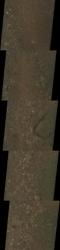
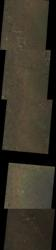
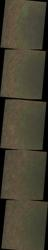
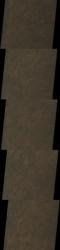
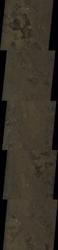
...
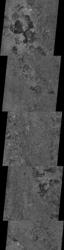
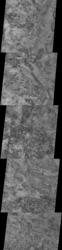
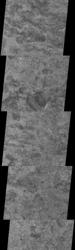
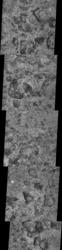
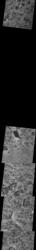

In [34]:
# See the images output
pipeline.images

If you want to check how an specific image changed, you can run the command `pipeline.images.show(image_number)`. Just replace `image_number` by a specific image index


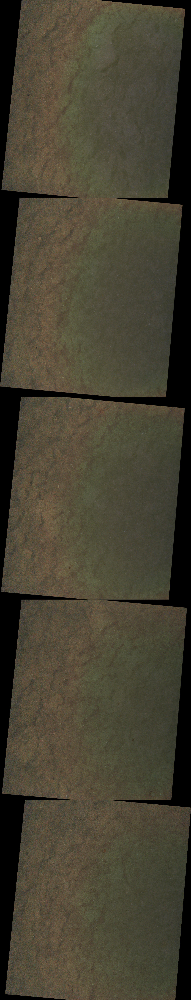
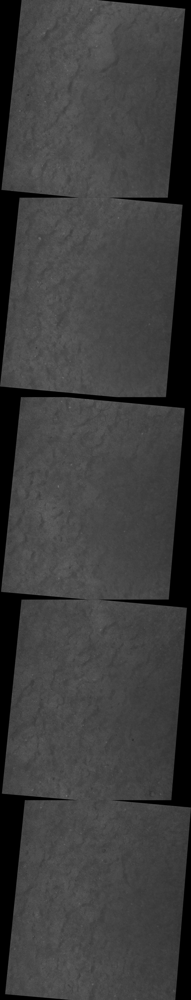
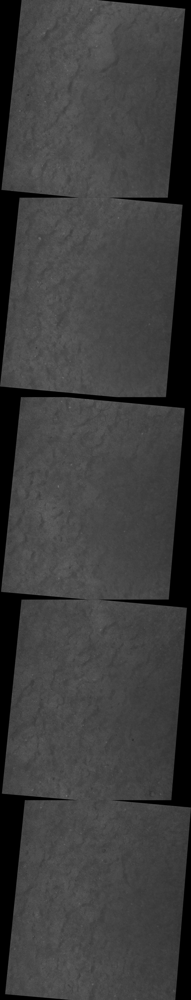
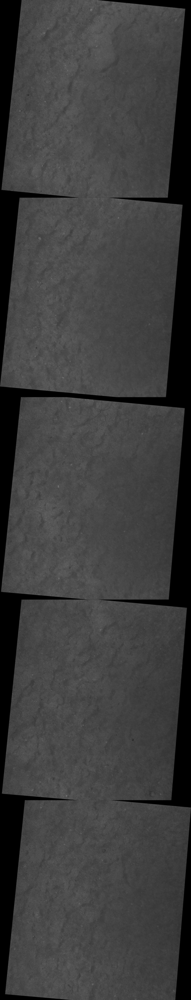
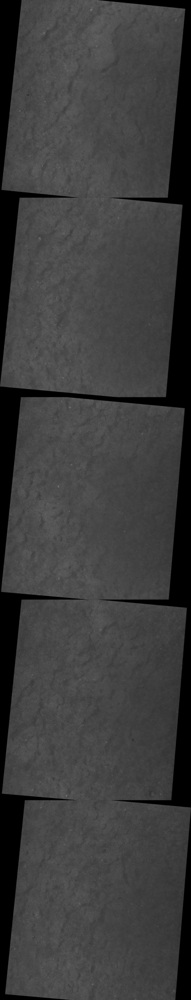
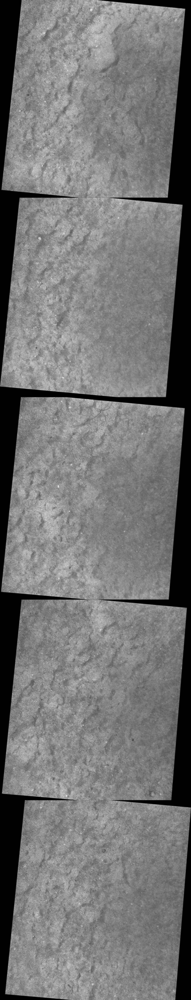
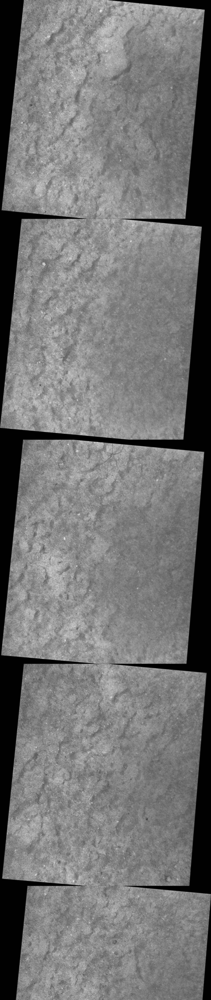

In [35]:
pipeline.images.show(image_number=2)

# Export Images to file

To export images the images to the files, just run `pipeline.save_images(image_format="png")`. You can change the output format

In [36]:
pipeline.save_images(image_format="jpg")

☁ paidiverpy ☁  |       INFO | 2025-02-27 19:13:32 | Saving images from step: last
☁ paidiverpy ☁  |       INFO | 2025-02-27 19:13:32 | Saving images using Dask
[########################################] | 100% Completed | 413.19 ms
☁ paidiverpy ☁  |       INFO | 2025-02-27 19:13:32 | Images are saved to: output


# Now it's your turn!  

Using the same dataset, explore the following tasks:  

1. **Adjust hyperparameters** – Modify the hyperparameters of each processing step and observe how they affect the results.  

2. **Add new steps** – Experiment with additional steps in the pipeline. You can find details about available steps and their hyperparameters [here](https://paidiverpy.readthedocs.io/en/latest/steps/introduction.html).  

3. **Change the output format** – Save the processed images in a different format, such as `jpg`.  

4. **Rename the images** – Try renaming the output images. See the [renaming guide](https://paidiverpy.readthedocs.io/en/latest/guide/rename_images/index.html) for more details.  

5. **🔹 Advanced: Modify the sampling step**  
   Edit the sampling step using the parameters below:  

   ```yaml
   - sampling:
      name: "datetime"
      mode: "datetime"
      test: True
      params:
        min: "2016-05-11 04:14:00"
        max: "2016-05-11 09:26:12"
   ```  

   Ensure `test: True` is set—this prevents the step from modifying the layer but generates diagnostic plots to help you fine-tune your parameters. Learn more [here](https://nbviewer.org/github/paidiver/paidiverpy/blob/main/examples/example_notebooks/pipeline_testing_steps.ipynb).  

6. **🔹 Advanced: Experiment with parallel processing**  
   Modify the `n_jobs` parameter to see how different levels of parallelism affect performance. Be cautious—using `n_jobs: 1` with the full dataset may lead to memory issues. Find more details in the [performance guide](https://paidiverpy.readthedocs.io/en/latest/guide/performance/index.html).  

In [37]:
#import the package
from paidiverpy.pipeline import Pipeline

In [20]:
# inspect the pipeline

In [21]:
# inspect the metadata

In [22]:
# run the pipeline

In [24]:
# see the output images

In [ ]:
# export the images